In [1]:
import donkeycar as dk
import keras
import h5py
import os
import time
import numpy as np
import pandas as pd
from donkeycar import utils
from PIL import Image, ImageDraw
import cv2
import random
from donkeycar.tools.fisheye_undistort import undistort

%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = [16, 8]

Using TensorFlow backend.


In [115]:
def random_rects(data):
    img_in = data['cam/image_array']
    # Draw random rectangles over the image so we don't overfit to one feature.
    w = img_in.shape[1]
    h = img_in.shape[0]
    img = Image.fromarray(img_in)
    draw = ImageDraw.Draw(img)
    for i in range(random.randint(0, 32)):
        rs = np.random.rand(4)
        rc = np.random.randn(3) * 0.3
        rc = np.clip(rc, -1.0, 1.0) * 127 + 127
        draw.rectangle([(rs[0]*1.4-0.2)*w, (rs[1]*1.4-0.2)*h, (rs[0]*1.4-0.2)*w + rs[2]*20, (rs[1]*1.4-0.2)*h + rs[3]*20], fill=(int(rc[0]), int(rc[1]), int(rc[2])))
    data['cam/image_array'] = np.asarray(img)
    return data

def brightness(data):
    img_in = data['cam/image_array']
    image1 = cv2.cvtColor(img_in,cv2.COLOR_RGB2HSV)
    image1 = np.array(image1, dtype = np.float64)
    random_bright = .3+np.random.uniform()
    image1[:,:,2] = image1[:,:,2]*random_bright
    image1[:,:,2][image1[:,:,2]>255]  = 255
    image1 = np.array(image1, dtype = np.uint8)
    data['cam/image_array'] = cv2.cvtColor(image1,cv2.COLOR_HSV2RGB)
    return data

def white_unbalance(data):
    img_in = data['cam/image_array']
    # Adjust white balance.
    min_channel_high_end = 0.25
    max_channel_low_end = 0.25
    rmin = random.random()*min_channel_high_end
    gmin = random.random()*min_channel_high_end
    bmin = random.random()*min_channel_high_end
    rmax = random.random()*max_channel_low_end + 1 - max_channel_low_end
    gmax = random.random()*max_channel_low_end + 1 - max_channel_low_end
    bmax = random.random()*max_channel_low_end + 1 - max_channel_low_end
    new_image = np.empty(img_in.shape, dtype=np.float32)
    image = np.multiply(img_in, 1/255.)

    # Make exposure ocasionally brighter
    image = np.clip(np.multiply(image, random.random()*0.3+1.0), 0.0, 1.0)

    new_image[:, :, 0] = np.add(np.multiply(image[:, :, 0], (rmax-rmin)), rmin)
    new_image[:, :, 1] = np.add(np.multiply(image[:, :, 1], (gmax-gmin)), gmin)
    new_image[:, :, 2] = np.add(np.multiply(image[:, :, 2], (bmax-bmin)), bmin)
    data['cam/image_array'] = np.multiply(new_image, 255).astype(np.uint8)
    return data

Tub does exist


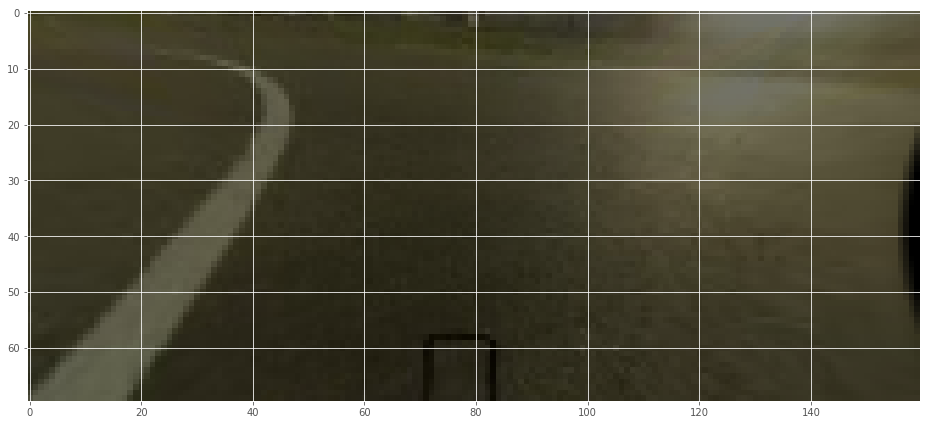

In [145]:
tub = dk.parts.Tub('../../donkeycar/d2/data/tub_44_17-09-15')
idx = tub.get_index(shuffled=False)
rec = tub.get_record(idx[10])
result = brightness(rec)
plt.imshow(result['cam/image_array'])

In [3]:
def dataset_from_tub(tub_path, limit=500):
    tub = dk.parts.Tub(tub_path)
    idx = tub.get_index(shuffled=False)
    img_in = []
    angle_out = []
    throttle_out = []
    if limit==-1:
        limit = len(idx)

    for i in range(limit):
        rec = tub.get_record(idx[i])
        img_in.append(rec['cam/image_array'])
        angle_out.append(rec['user/angle'])
        throttle_out.append(rec['user/throttle'])
    return (np.array(img_in), np.array(angle_out), np.array(throttle_out))

def dataset_from_all_tubs(data_path):
    tub_paths = [os.path.join(data_path, n) for n in os.listdir(data_path)]
    datasets = [dataset_from_tub(p, limit=-1) for p in tub_paths]
    img_in = [ds[0] for ds in datasets]
    angle_out = [ds[1] for ds in datasets]
    throttle_out = [ds[2] for ds in datasets]
    return (np.concatenate(img_in), np.concatenate(angle_out), np.concatenate(throttle_out))

def multiply_dataset(dataset, multiple=6):
    img_in = []
    angle_out = []
    throttle_out = []
    for i in range(multiple):
        for j in range(len(dataset[0])):
            img_in.append(randomize(dataset[0][j]))
            angle_out.append(dataset[1][j])
            throttle_out.append(dataset[2][j])
    return (np.array(img_in), np.array(angle_out), np.array(throttle_out))

def bin_angle_out(angle_out):
    return np.array([dk.utils.linear_bin(o) for o in angle_out])

def output_pair_cat(model, dataset):
    X, Y = dataset
    angle_binned, throttle = model.predict(X)
    predicted = dk.utils.unbin_Y(angle_binned)
    return (predicted, Y)

def output_pair_lin(model, dataset):
    X, Y = dataset
    predicted, throttle = model.predict(X)
    return (predicted, Y)

def split_dataset(dataset, split=0.2):
    train_idx = []
    val_idx = []
    for i in range(dataset[0].shape[0]):
        if random.random() > split:
            train_idx.append(i)
        else:
            val_idx.append(i)
    
    train_ds = (dataset[0][train_idx], dataset[1][train_idx], dataset[2][train_idx])
    val_ds = (dataset[0][val_idx], dataset[1][val_idx], dataset[2][val_idx])
    return train_ds, val_ds

In [4]:
original_dataset = dataset_from_all_tubs('../../donkeycar/d2/data')
# original_dataset = (original_dataset[0], bin_angle_out(original_dataset[1]), original_dataset[2])

Tub does exist
Tub does exist
Tub does exist


In [5]:
train_set, val_set = split_dataset(original_dataset, split=0.3)
dataset = multiply_dataset(train_set, multiple=12)

In [6]:
def classification_model():
    from keras.layers import Input, Dense, merge
    from keras.models import Model
    from keras.layers import Convolution2D, MaxPooling2D, Reshape, BatchNormalization
    from keras.layers import Activation, Dropout, Flatten, Dense

    img_in = Input(shape=(120, 160, 3), name='img_in')                      # First layer, input layer, Shape comes from camera.py resolution, RGB
    x = img_in
    x = Convolution2D(24, (5,5), strides=(2,2), activation='relu')(x)       # 24 features, 5 pixel x 5 pixel kernel (convolution, feauture) window, 2wx2h stride, relu activation
    x = Convolution2D(32, (5,5), strides=(2,2), activation='relu')(x)       # 32 features, 5px5p kernel window, 2wx2h stride, relu activatiion
    x = Convolution2D(64, (5,5), strides=(2,2), activation='relu')(x)       # 64 features, 5px5p kernal window, 2wx2h stride, relu
    x = Convolution2D(64, (3,3), strides=(2,2), activation='relu')(x)       # 64 features, 3px3p kernal window, 2wx2h stride, relu
    x = Convolution2D(64, (3,3), strides=(1,1), activation='relu')(x)       # 64 features, 3px3p kernal window, 1wx1h stride, relu

    # Possibly add MaxPooling (will make it less sensitive to position in image).  Camera angle fixed, so may not to be needed

    x = Flatten(name='flattened')(x)                                        # Flatten to 1D (Fully connected)
    x = Dense(100, activation='relu')(x)                                    # Classify the data into 100 features, make all negatives 0
    x = Dropout(.1)(x)                                                      # Randomly drop out (turn off) 10% of the neurons (Prevent overfitting)
    x = Dense(50, activation='relu')(x)                                     # Classify the data into 50 features, make all negatives 0
    x = Dropout(.1)(x)                                                      # Randomly drop out 10% of the neurons (Prevent overfitting)
    #categorical output of the angle
    angle_out = Dense(15, activation='softmax', name='angle_out')(x)        # Connect every input with every output and output 15 hidden units. Use Softmax to give percentage. 15 categories and find best one based off percentage 0.0-1.0

    #continous output of throttle
    throttle_out = Dense(1, activation='relu', name='throttle_out')(x)      # Reduce to 1 number, Positive number only

    model = Model(inputs=[img_in], outputs=[angle_out, throttle_out])
    model.compile(optimizer='rmsprop',
                  loss={'angle_out': 'categorical_crossentropy',
                        'throttle_out': 'mean_squared_error'},
                  loss_weights={'angle_out': 0.9, 'throttle_out': .001})

    return model


In [ ]:
save_best = keras.callbacks.ModelCheckpoint("/home/ubuntu/donkeycar/d2/models/ws.cls.gen",
                                            monitor='val_loss',
                                            verbose=1,
                                            save_best_only=True,
                                            mode='min')

#stop training if the validation error stops improving.
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss',
                                           min_delta=.0005,
                                           patience=10,
                                           verbose=1,
                                           mode='auto')
# tensor_board = keras.callbacks.TensorBoard(log_dir="/home/ubuntu/donkeycar/d2/logs/{0}".format(time.time()), histogram_freq=1, write_graph=True, write_images=True)

callbacks_list = [save_best, early_stop]

model = classification_model()
model.fit(x=dataset[0],
          y={"angle_out": dataset[1], "throttle_out": dataset[2]},
          batch_size=128,
          epochs=100,
          callbacks=callbacks_list,
          validation_data=(val_set[0], {"angle_out": val_set[1], "throttle_out": val_set[2]}),
          shuffle=True)

Train on 293448 samples, validate on 10526 samples
Epoch 1/100
293448/293448 [==============================] - 196s - loss: 0.7631 - angle_out_loss: 0.8453 - throttle_out_loss: 2.3891 - val_loss: 0.6641 - val_angle_out_loss: 0.7379 - val_throttle_out_loss: 0.0691
Epoch 2/100
293448/293448 [==============================] - 198s - loss: 0.5054 - angle_out_loss: 0.5614 - throttle_out_loss: 0.0691 - val_loss: 0.6136 - val_angle_out_loss: 0.6818 - val_throttle_out_loss: 0.0691
Epoch 3/100
293448/293448 [==============================] - 199s - loss: 0.4378 - angle_out_loss: 0.4864 - throttle_out_loss: 0.0691 - val_loss: 0.7845 - val_angle_out_loss: 0.8716 - val_throttle_out_loss: 0.0691
Epoch 4/100
293448/293448 [==============================] - 197s - loss: 0.4159 - angle_out_loss: 0.4620 - throttle_out_loss: 0.0691 - val_loss: 0.6099 - val_angle_out_loss: 0.6776 - val_throttle_out_loss: 0.0691
Epoch 5/100
293448/293448 [==============================] - 187s - loss: 8.0944 - angle_out_

KeyboardInterrupt: 

In [ ]:
def regression_model():
    from keras.layers import Input, Dense, merge
    from keras.models import Model
    from keras.layers import Convolution2D, MaxPooling2D, Reshape, BatchNormalization
    from keras.layers import Activation, Dropout, Flatten, Dense

    img_in = Input(shape=(120,160,3), name='img_in')
    x = img_in
    x = Convolution2D(24, (5,5), strides=(2,2), activation='relu')(x)
    x = Convolution2D(32, (5,5), strides=(2,2), activation='relu')(x)
    x = Convolution2D(64, (5,5), strides=(2,2), activation='relu')(x)
    x = Convolution2D(64, (3,3), strides=(2,2), activation='relu')(x)
    x = Convolution2D(64, (3,3), strides=(1,1), activation='relu')(x)

    x = Flatten(name='flattened')(x)
    x = Dense(100, activation='linear')(x)
    x = Dropout(.1)(x)
    x = Dense(50, activation='linear')(x)
    x = Dropout(.1)(x)
    x = Dense(10, activation='linear')(x)
    x = Dropout(.1)(x)
    #categorical output of the angle
    angle_out = Dense(1, activation='linear', name='angle_out')(x)

    #continous output of throttle
    throttle_out = Dense(1, activation='linear', name='throttle_out')(x)

    model = Model(inputs=[img_in], outputs=[angle_out, throttle_out])

    model.compile(optimizer='rmsprop',
                  loss={'angle_out': 'mean_absolute_error',
                        'throttle_out': 'mean_squared_error'},
                  loss_weights={'angle_out': 1.0, 'throttle_out': .00})
    return model

In [ ]:
save_best = keras.callbacks.ModelCheckpoint("/home/ubuntu/donkeycar/d2/models/ws.nb.gen",
                                            monitor='val_loss',
                                            verbose=1,
                                            save_best_only=True,
                                            mode='min')

#stop training if the validation error stops improving.
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss',
                                           min_delta=.000005,
                                           patience=5,
                                           verbose=1,
                                           mode='auto')

tensor_board = keras.callbacks.TensorBoard(log_dir="/home/ubuntu/donkeycar/d2/logs/{0}".format(time.time()), histogram_freq=1, write_graph=True, write_images=True)

callbacks_list = [save_best, early_stop]

model = regression_model()
model.fit(x=dataset[0],
          y={"angle_out": dataset[1], "throttle_out": dataset[2]},
          batch_size=128,
          epochs=100,
          callbacks=callbacks_list,
          validation_split=0.2,
          shuffle=True)

Train on 233356 samples, validate on 58340 samples
Epoch 1/100
233356/233356 [==============================] - 158s - loss: 0.2283 - angle_out_loss: 0.2283 - throttle_out_loss: 2.9364 - val_loss: 0.0730 - val_angle_out_loss: 0.0730 - val_throttle_out_loss: 0.2111
Epoch 2/100
233356/233356 [==============================] - 158s - loss: 0.0694 - angle_out_loss: 0.0694 - throttle_out_loss: 0.3507 - val_loss: 0.0798 - val_angle_out_loss: 0.0798 - val_throttle_out_loss: 0.6495
Epoch 3/100
233356/233356 [==============================] - 159s - loss: 0.0632 - angle_out_loss: 0.0632 - throttle_out_loss: 1.1226 - val_loss: 0.0607 - val_angle_out_loss: 0.0607 - val_throttle_out_loss: 1.7769
Epoch 4/100
233356/233356 [==============================] - 160s - loss: 0.0596 - angle_out_loss: 0.0596 - throttle_out_loss: 4.5237 - val_loss: 0.0627 - val_angle_out_loss: 0.0627 - val_throttle_out_loss: 6.6368
Epoch 5/100
233356/233356 [==============================] - 159s - loss: 0.0577 - angle_out_

In [218]:
import numpy as np
import os
import glob
import sys
import cv2


DIM=(1600, 1200)
K=np.array([[781.3524863867165, 0.0, 794.7118000552183], [0.0, 779.5071163774452, 561.3314451453386], [0.0, 0.0, 1.0]])
D=np.array([[-0.042595202508066574], [0.031307765215775184], [-0.04104704724832258], [0.015343014605793324]])

def undistort_maps(img, balance):
    h,w = img.shape[:2]

    assert w/h == DIM[0]/DIM[1], "Image to undistort needs to have same aspect ratio as the ones used in calibration"

    scaled_K = K * w / DIM[0]
    scaled_K[2][2] = 1 # K[2][2] is always 1
    newmtx = cv2.fisheye.estimateNewCameraMatrixForUndistortRectify(scaled_K, D, (w,h), np.eye(3), balance=balance)
    return cv2.fisheye.initUndistortRectifyMap(scaled_K, D, np.eye(3), newmtx, (w,h), cv2.CV_16SC2)

def undistort(img, balance=0.0):
    map1, map2 = undistort_maps(img, balance)
    return cv2.remap(img, map1, map2, interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)

# img = Image.open('../../donkeycar/d2/data/tub_44_17-09-15/154_cam-image_array_.jpg')
# img = img.resize((160*2, 120*2), resample=Image.LANCZOS)
img = Image.open('../../donkeycar/2.jpg')
img = np.array(img)
# img = undistort(img, balance=0.97)
img = undistort(img, balance=0.5)
cv2.imwrite("../../donkeycar/a2.jpg", img)

True

array([[  4.71110159e-01,  -1.31028254e-01,   6.51425749e+01],
       [ -5.71542483e-02,   6.88431813e-01,   1.40642884e+01],
       [ -1.59546298e-03,  -1.77215831e-04,   1.00000000e+00]])

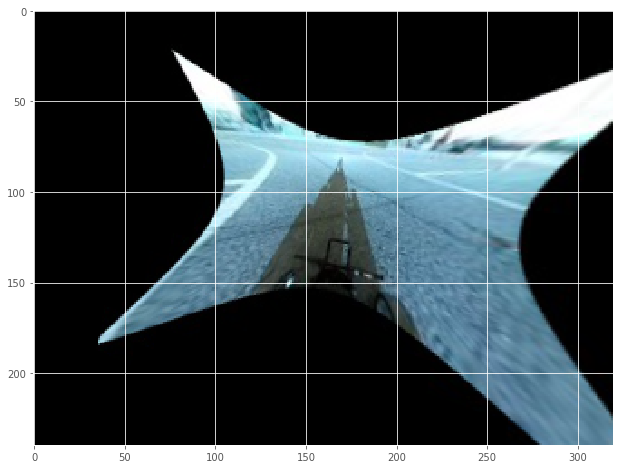

In [227]:
src = np.array([(134,99),(183,102),(191,133),(124,128)], dtype = "float32")
dst = np.array([(150,97),(200,107),(205,141),(137,122)], dtype = "float32")
M = cv2.getPerspectiveTransform(src, dst)
img = Image.open('../../donkeycar/a.jpg')
img_out = cv2.warpPerspective(np.asarray(img), M, (320,240))
plt.imshow(img_out)
cv2.imwrite("../../donkeycar/aa.jpg", img_out)
M